Introduction
============

This is an interactive notebook regarding "Introduction to path planning". (Author: Björn Hein)

Version | Author
------------ | -------------
0.2 | Björn Hein


License is based on Creative Commons: Attribution-NonCommercial 4.0 International (CC BY-NC 4.0) (please check: http://creativecommons.org/licenses/by-nc/4.0/)

This notebook imports all discussed algorithms and does a comparison

Important links are:

* General Info: http://www.python.org
* Python tutorial http://www.python.org/doc/tut/
* NetworkX http://networkx.github.io/
* NumPy and SciPy Guide http://docs.scipy.org/
* Matplotlib gallery http://matplotlib.sourceforge.net/gallery.html


Remember that:

* you have to press ctrl-return or shift-return, to execute the code in the code sections, only then the variables are "generated" and can be used
* you can execute the whole notebook by Cell->runAll

Adding all planners
===========


In [1]:
import matplotlib.pylab as plt
%matplotlib inline
from IPPerfMonitor import IPPerfMonitor
import IPBasicPRM
import IPVISBasicPRM
from IPNodeSampling import CollidingEdgeSampler, BridgeSampler

import IPVisibilityPRM
import IPVISVisibilityPRM

import IPLazyPRM
import IPVISLazyPRM
import IPEarlyPRM

import IPRRT
import IPVISRRT

import IPAStar
import IPVISAStar

import IPEarlyPRM
import pandas as pd
import numpy as np
import random

Set-up of the test scenario and the configuration for all planners
===================================

Following a procedure to compare all discussed planners are shown:

1. Configuration for every planner is defined
2. The configuration and the planner is stored in the variable setup, a Python dict()
3. The variable setup is then used to uniformly execute the planners


In [2]:
plannerFactory = dict()

basicConfig = dict()
basicConfig["radius"] = 3
basicConfig["numNodes"] = 200
plannerFactory["basePRM"] = [IPBasicPRM.BasicPRM, basicConfig, IPVISBasicPRM.basicPRMVisualize]


basicConfig2 = dict()
basicConfig2["radius"] = 6
basicConfig2["numNodes"] = 600
plannerFactory["basePRM2"] = [IPBasicPRM.BasicPRM, basicConfig2, IPVISBasicPRM.basicPRMVisualize]

basicConfig3 = dict()
basicConfig3["radius"] = 15
basicConfig3["numNodes"] = 300
plannerFactory["basePRM3"] = [IPBasicPRM.BasicPRM, basicConfig3, IPVISBasicPRM.basicPRMVisualize]

visibilityConfig = dict()
visibilityConfig["ntry"] = 300
plannerFactory["visibilityPRM"] = [IPVisibilityPRM.VisPRM, visibilityConfig, IPVISVisibilityPRM.visibilityPRMVisualize ]

lazyConfig = dict()
lazyConfig["initialRoadmapSize"] = 10
lazyConfig["updateRoadmapSize"]  = 5 
lazyConfig["kNearest"] = 8
lazyConfig["maxIterations"] = 20
plannerFactory["lazyPRM"] = [IPLazyPRM.LazyPRM, lazyConfig, IPVISLazyPRM.lazyPRMVisualize]

astarConfig = dict()
astarConfig["heuristic"] = 'euclidean' 
astarConfig["w"]  = 0.5
plannerFactory["astar"] = [IPAStar.AStar, astarConfig, IPVISAStar.aStarVisualize]

astarConfig2 = dict()
astarConfig2["heuristic"] = 'euclidean' 
astarConfig2["w"]  = 0.9
plannerFactory["astar2"] = [IPAStar.AStar, astarConfig2, IPVISAStar.aStarVisualize]


rrtSimpleConfig = dict()
rrtSimpleConfig["numberOfGeneratedNodes"] = 100 
rrtSimpleConfig["testGoalAfterNumberOfNodes"]  = 10
plannerFactory["simpleRRT"] = [IPRRT.RRTSimple, rrtSimpleConfig, IPVISRRT.rrtPRMVisualize]




In [3]:
class ResultCollection (object):
    
    def __init__(self, plannerFactoryName, planner, benchmark, solution, perfDataFrame):
        self.plannerFactoryName = plannerFactoryName
        self.planner = planner
        self.benchmark = benchmark
        self.solution = solution
        self.perfDataFrame = perfDataFrame

In [4]:
import IPTestSuite as ts
from shapely.geometry import Point, Polygon, LineString
from shapely import plotting


In [5]:
#import importlib
#importlib.reload(IPTestSuiteSS2024)

In [6]:
fullBenchList = ts.benchList

for benchmark in fullBenchList:
    print(benchmark.name)

Trap
Bottleneck
Fat bottleneck
MyField
Zigzag Traps
Empty Field
Clutter Forest
Dual Path
Nested Trap
Giant Square


In [7]:
resultList = list()
testList = fullBenchList

for key,producer in list(plannerFactory.items()):
    print(key, producer)
    for benchmark in testList:
        print ("Planning: " + key + " - " + benchmark.name)
        #planner = IPBasicPRM.BasicPRM(benchmark.collisionChecker)
        planner = producer[0](benchmark.collisionChecker)
        IPPerfMonitor.clearData()
        try:
            
            resultList.append(ResultCollection(key,
                                          planner, 
                                           benchmark, 
                                           planner.planPath(benchmark.startList,benchmark.goalList,producer[1]),
                                           IPPerfMonitor.dataFrame()
                                          ),
                        )
        except Exception as e:
        #    throw e
            print ("PLANNING ERROR ! PLANNING ERROR ! PLANNING ERROR ", e)
            pass
            



basePRM [<class 'IPBasicPRM.BasicPRM'>, {'radius': 3, 'numNodes': 200}, <function basicPRMVisualize at 0x000001A37E3B8540>]
Planning: basePRM - Trap
Planning: basePRM - Bottleneck
Planning: basePRM - Fat bottleneck
Planning: basePRM - MyField
Planning: basePRM - Zigzag Traps
Planning: basePRM - Empty Field
Planning: basePRM - Clutter Forest
Planning: basePRM - Dual Path
Planning: basePRM - Nested Trap
Planning: basePRM - Giant Square
basePRM2 [<class 'IPBasicPRM.BasicPRM'>, {'radius': 6, 'numNodes': 600}, <function basicPRMVisualize at 0x000001A37E3B8540>]
Planning: basePRM2 - Trap
Planning: basePRM2 - Bottleneck
Planning: basePRM2 - Fat bottleneck
Planning: basePRM2 - MyField
Planning: basePRM2 - Zigzag Traps
Planning: basePRM2 - Empty Field
Planning: basePRM2 - Clutter Forest
Planning: basePRM2 - Dual Path
Planning: basePRM2 - Nested Trap
Planning: basePRM2 - Giant Square
basePRM3 [<class 'IPBasicPRM.BasicPRM'>, {'radius': 15, 'numNodes': 300}, <function basicPRMVisualize at 0x000001

c:\Users\erics\Uni\Innovative_Konzepte\Abgabe\intro-path-planning\venv\Lib\site-packages\networkx\drawing\nx_pylab.py:1497: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(
C:\Users\erics\AppData\Local\Temp\ipykernel_36476\3627444553.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_local = plt.figure(figsize=(10,10))


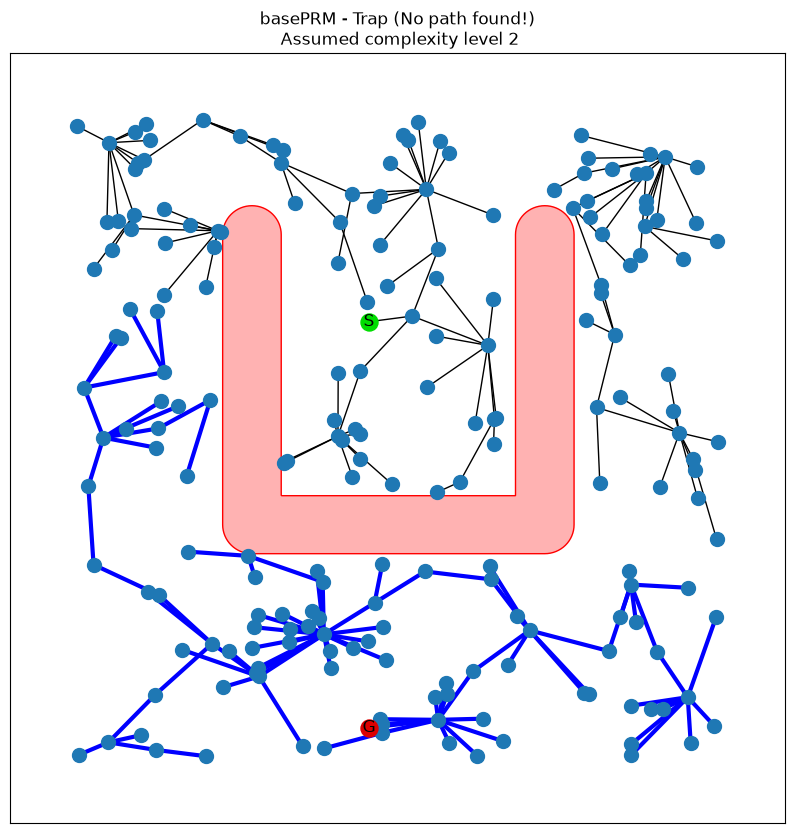

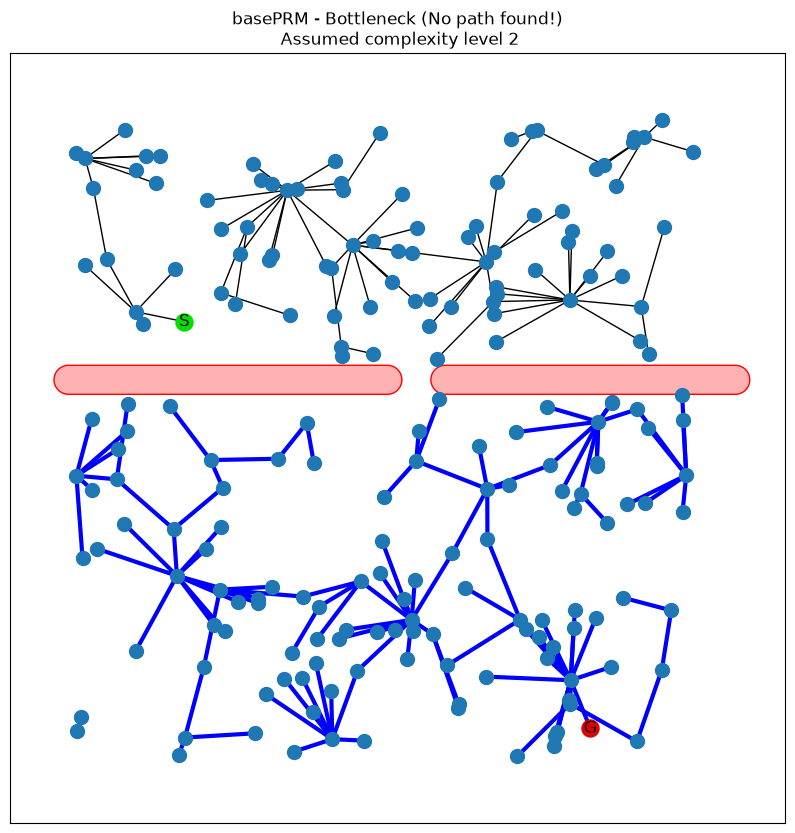

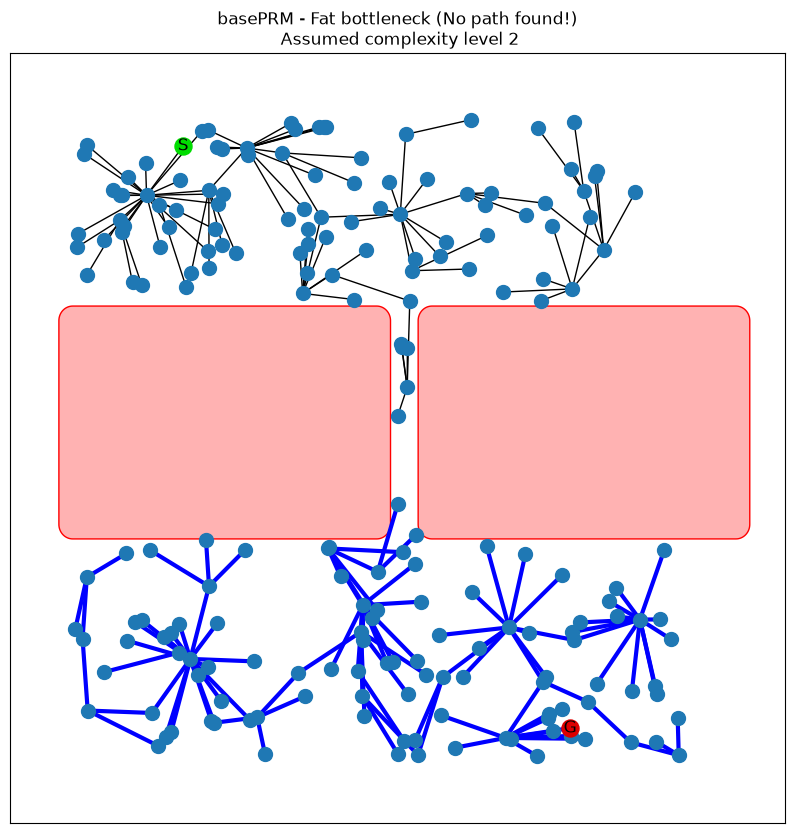

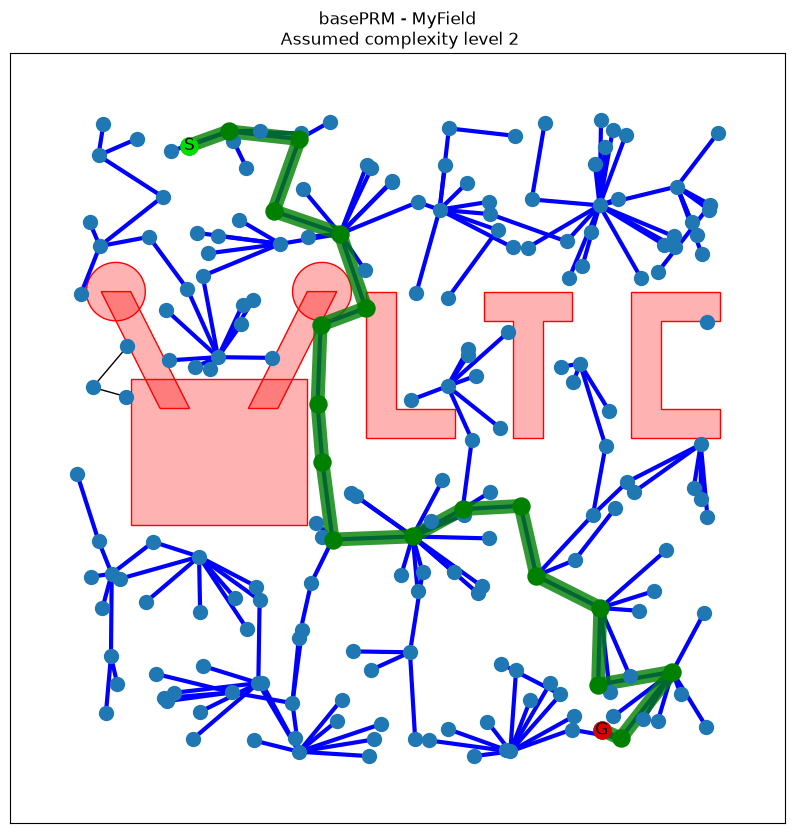

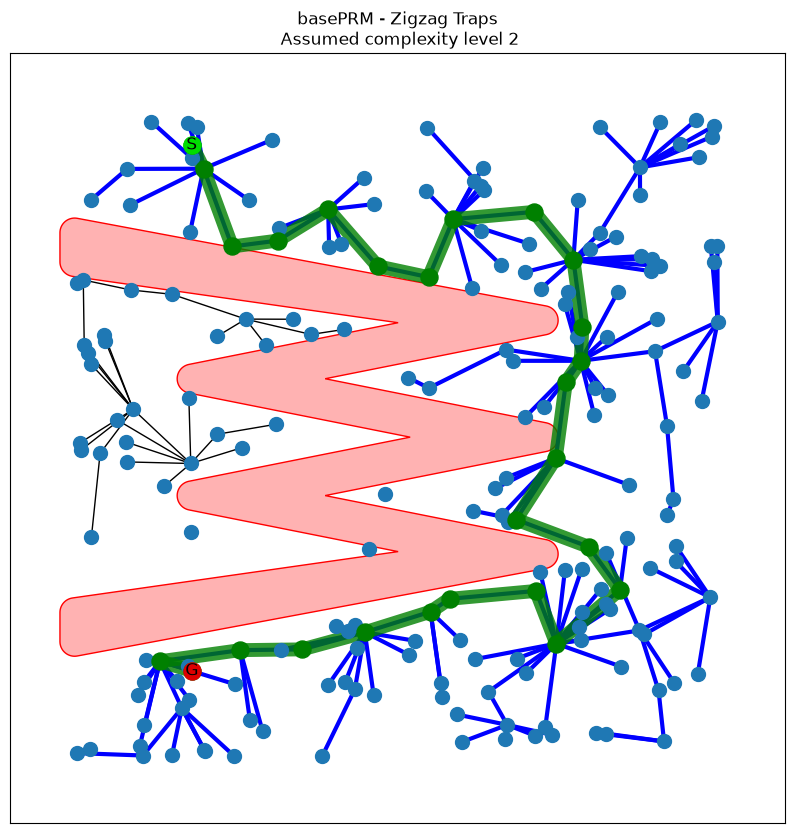

...

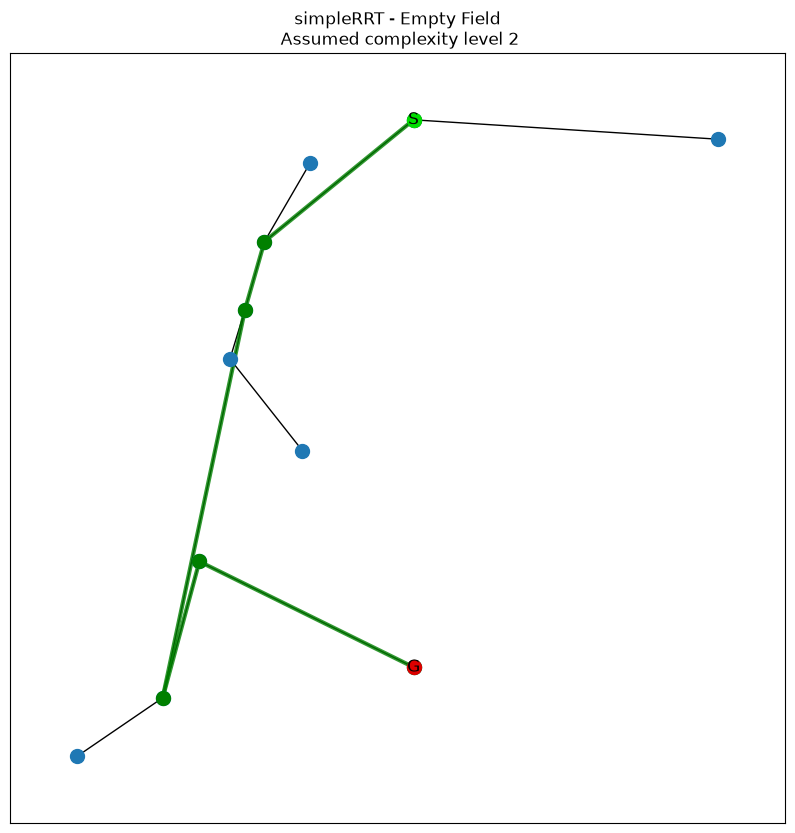

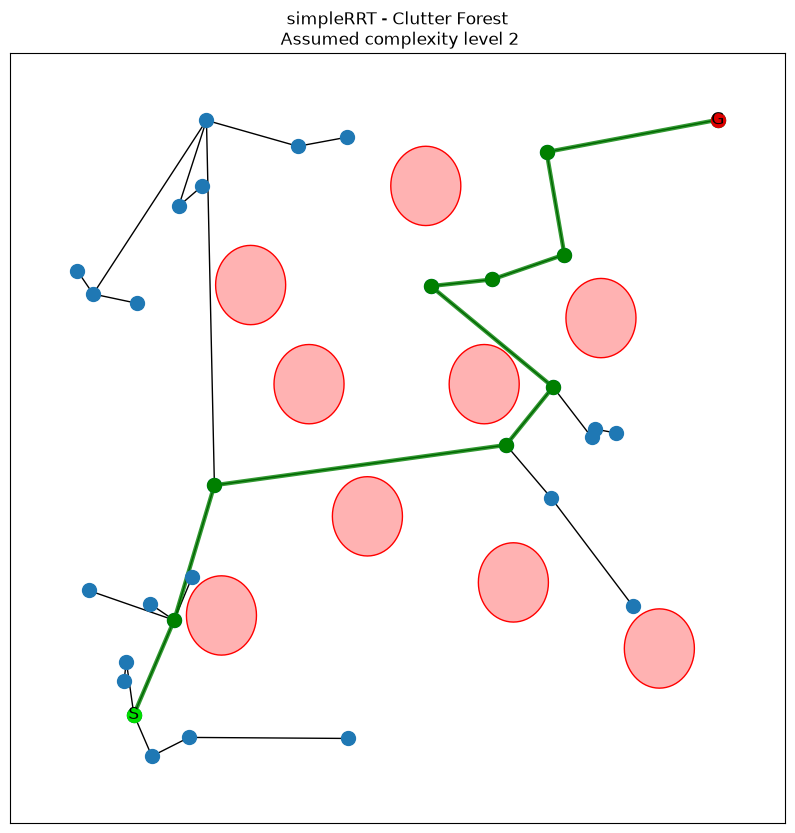

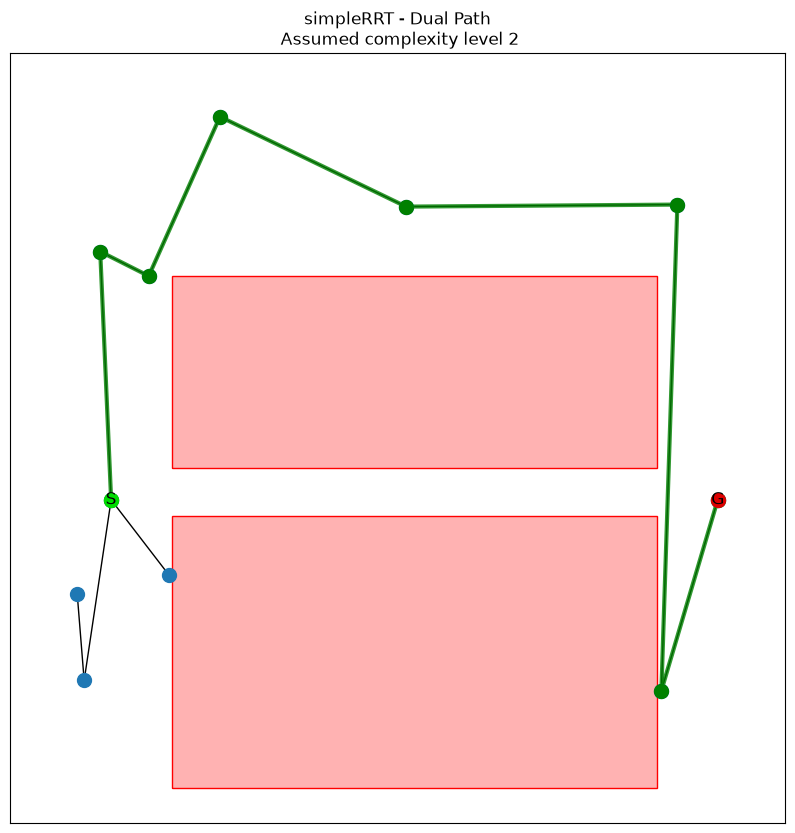

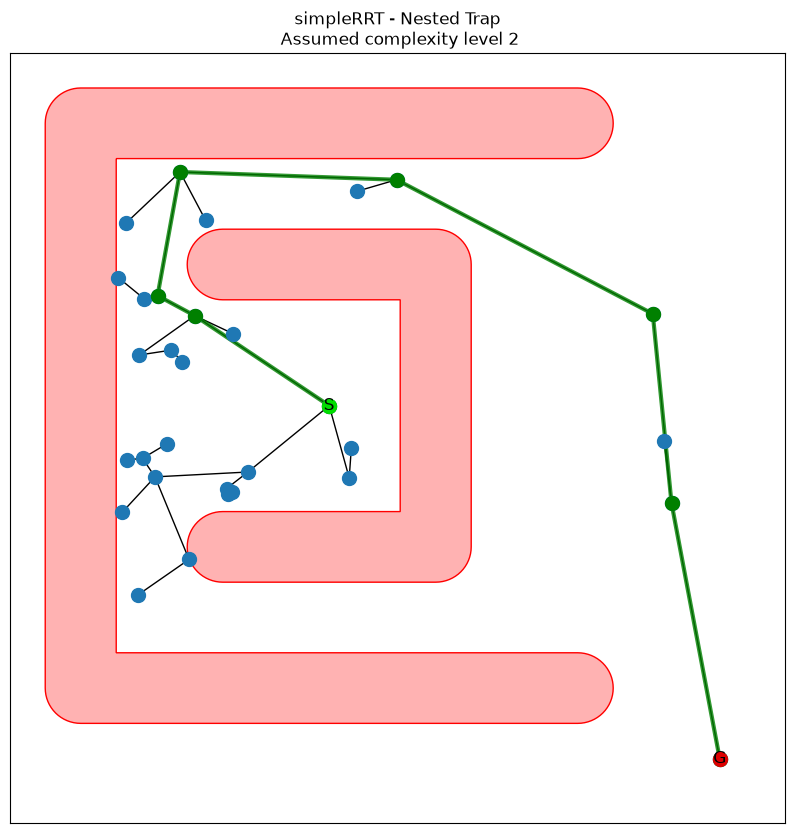

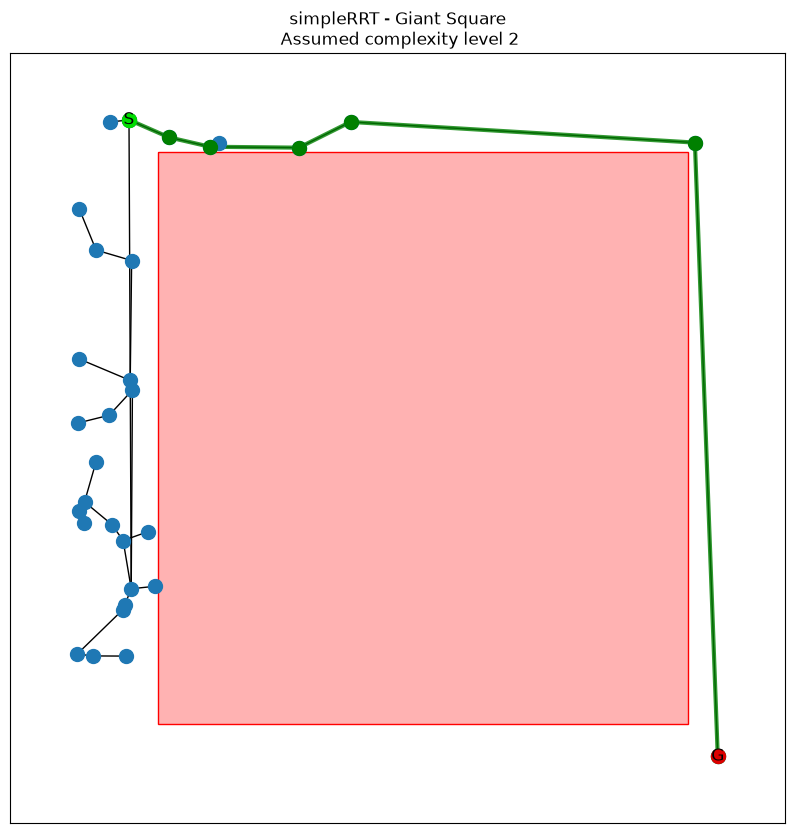

In [8]:
import matplotlib.pyplot as plt

for result in resultList:
    
    fig_local = plt.figure(figsize=(10,10))
    ax = fig_local.add_subplot(1,1,1)
    title = result.plannerFactoryName + " - " + result.benchmark.name
    if result.solution == []:
        title += " (No path found!)"
    title += "\n Assumed complexity level " + str(result.benchmark.level)
    ax.set_title(title)
    try:
        #IPVISBasicPRM.basicPRMVisualize(result.planner, result.solution, ax=ax, nodeSize=100))
        plannerFactory[result.plannerFactoryName][2](result.planner, result.solution, ax=ax, nodeSize=100)
    except Exception as e:
        print ("Error", e)
        pass
    

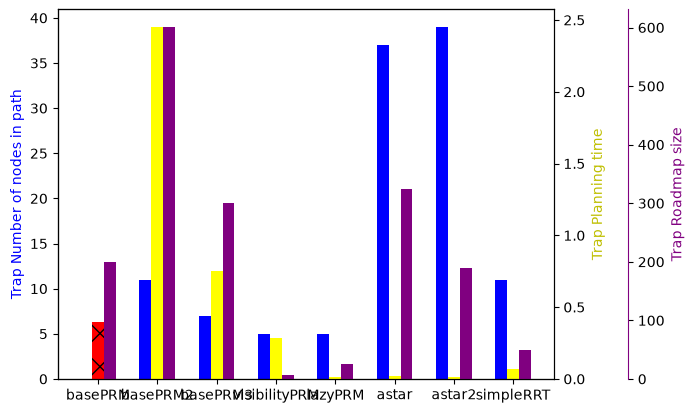

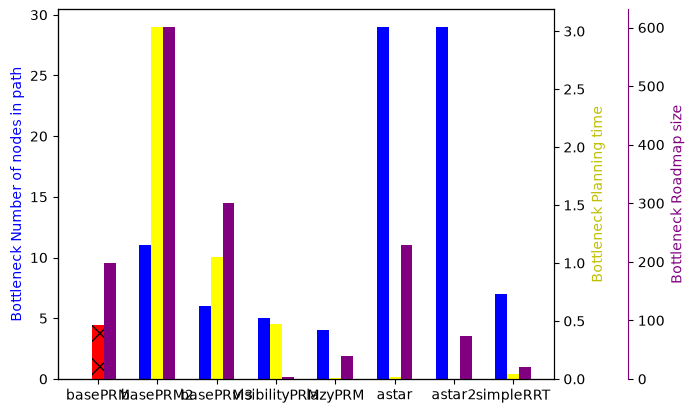

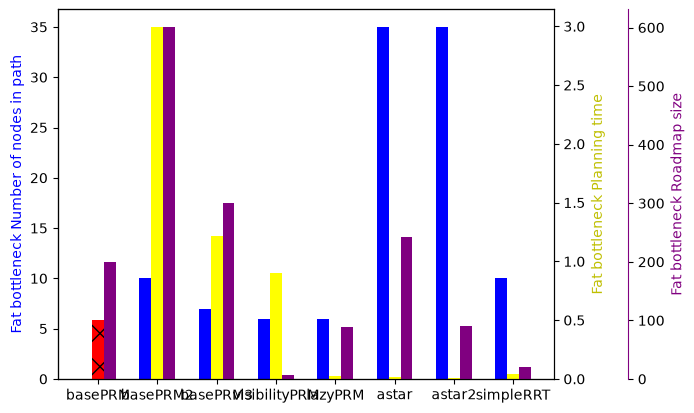

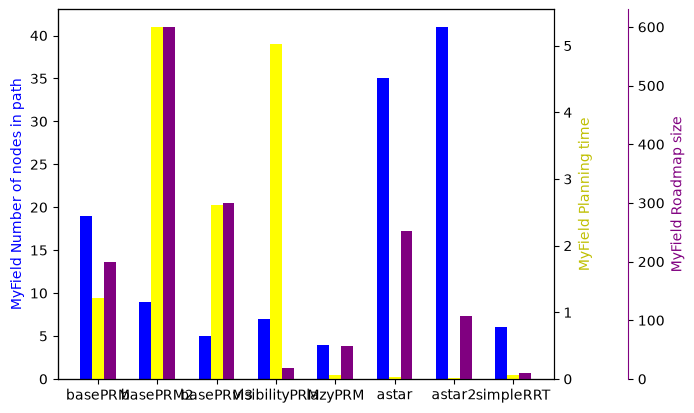

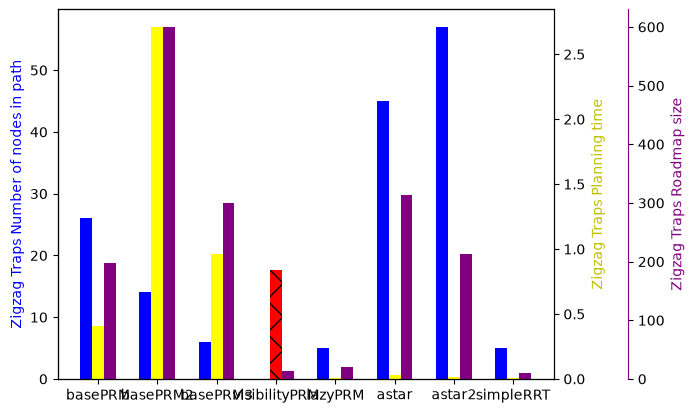

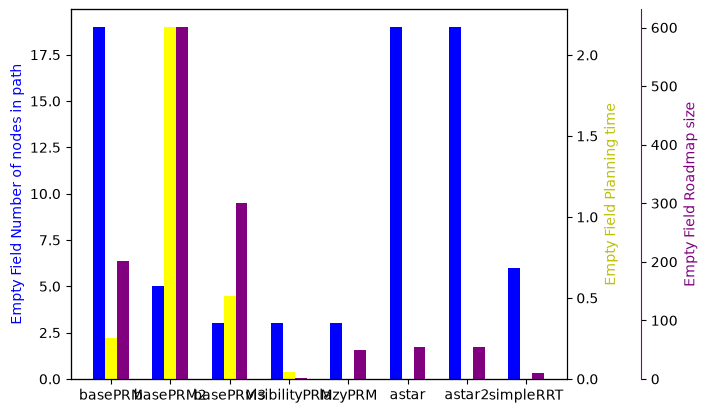

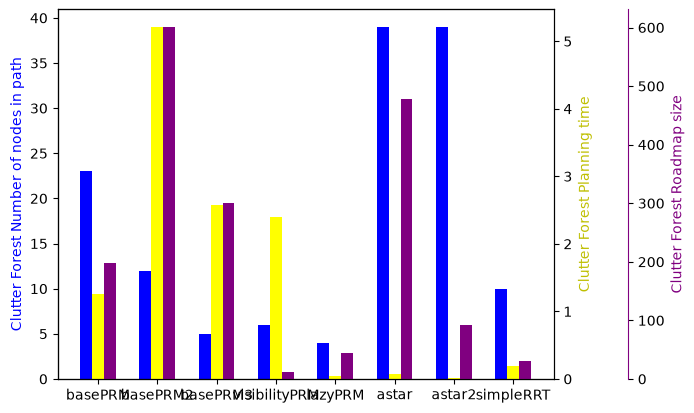

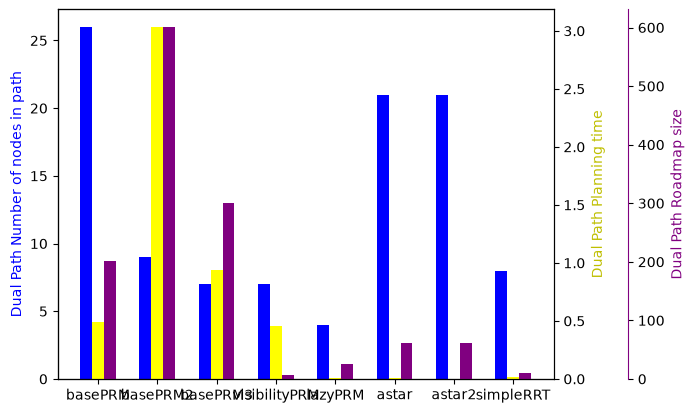

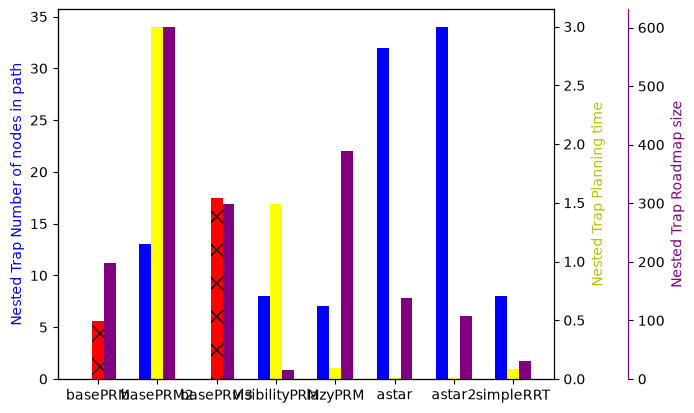

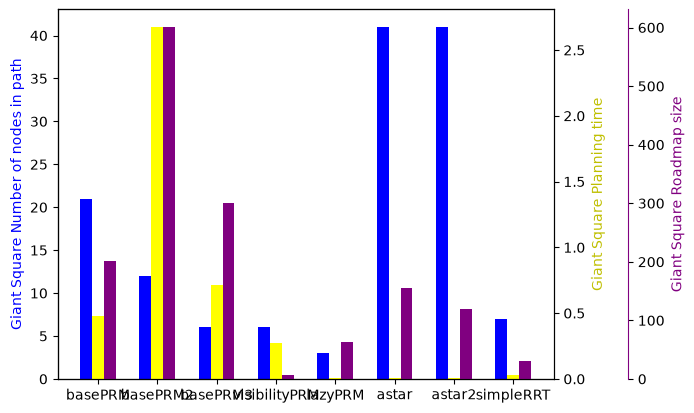

In [9]:
import numpy as np
for bench in testList:
    title = bench.name
    pathLength = dict()
    planningTime = dict()
    roadmapSize  = dict()
    
    try:
        for result in resultList:
            if result.benchmark.name == bench.name:
                #print result.benchmark.name  + " - " +  result.plannerFactoryName, len(result.solution)
                pathLength[result.plannerFactoryName] = len(result.solution)
                planningTime[result.plannerFactoryName] = result.perfDataFrame.groupby(["name"]).sum(numeric_only=True)["time"]["planPath"]
                roadmapSize[result.plannerFactoryName] = result.planner.graph.size()


        fig, ax = plt.subplots()

        width = 0.2

        ax.bar(np.arange(len(pathLength.keys())), pathLength.values(),width, color="blue")
        ax.set_ylabel(title + " Number of nodes in path", color="blue")
        ax.set_xticks(np.arange(len(pathLength.keys())) + width)
        ax.set_xticklabels(pathLength.keys())

        ax2 = ax.twinx()
        bar = ax2.bar(np.arange(len(pathLength.keys()))+width, planningTime.values(),width, color="red")
        ax2.set_ylabel(title + " Planning time", color="y")

        # Add coloring and patterns on axis two
        hatches = ['x' if length==0 else '' for length in pathLength.values()]
        color   = ['red' if length==0 else 'yellow' for length in pathLength.values()]
        for i,thisbar in enumerate(bar.patches):
            thisbar.set_facecolor(color[i])
            thisbar.set_hatch(hatches[i])

        # Multiple axes 
        ax3 = ax.twinx()
        ax3.bar(np.arange(len(pathLength.keys()))+2*width, roadmapSize.values(),width, color="purple")
        ax3.set_ylabel(title + " Roadmap size",  color="purple")
        ax3.spines['right'].set_position(('axes', 1.15))
        ax3.spines['right'].set_color("purple")
    except:
        pass


    
        
    

## Task 8 Benchmark Design

This section defines the Task 8 benchmark evaluation for 2-DoF point robots. We select five representative environments with increasing complexity and evaluate six planner variants across 100 reproducible runs per benchmark.

Selected benchmarks:
- **Giant Square** — large central obstacle with a long detour requirement
- **Fat bottleneck** — a long narrow passage
- **Clutter Forest** — scattered obstacles without one dominant route
- **Nested Trap** — hard trapped region requiring escape and backtracking
- **Zigzag Traps** — constrained zigzag corridors with local minima

Tracked metrics:
- success rate
- planning time
- roadmap size (number of nodes)
- path point count
- path length
- collision checks: point and line
- enhancement rounds and enhancement nodes added

In [10]:
# Keep the evaluated environments identical to the Task 8 report in Abgabe.ipynb.
selected_names = ["Giant Square", "Fat bottleneck", "Clutter Forest", "Nested Trap", "Zigzag Traps"]
selected_benchmarks = [b for b in ts.benchList if b.name in selected_names]
selected_benchmarks.sort(key=lambda b: selected_names.index(b.name))

print("Selected benchmarks:")
for benchmark in selected_benchmarks:
    print("-", benchmark.name)

Selected benchmarks:
- Giant Square
- Fat bottleneck
- Clutter Forest
- Nested Trap
- Zigzag Traps


In [11]:

variant_definitions = [
    ("LazyPRM", lambda env: IPLazyPRM.LazyPRM(env)),
    ("EarlyPRM", lambda env: IPEarlyPRM.EarlyPRM(env)),
    ("LazyPRM_CollidingEdge", lambda env: IPLazyPRM.LazyPRM(env, enhancer=CollidingEdgeSampler())),
    ("LazyPRM_Bridge", lambda env: IPLazyPRM.LazyPRM(env, enhancer=BridgeSampler())),
    ("EarlyPRM_CollidingEdge", lambda env: IPEarlyPRM.EarlyPRM(env, enhancer=CollidingEdgeSampler())),
    ("EarlyPRM_Bridge", lambda env: IPEarlyPRM.EarlyPRM(env, enhancer=BridgeSampler())),
]

benchmark_config = dict(
    initialRoadmapSize=10,
    updateRoadmapSize=5,
    kNearest=8,
    # AbstractGraphPRM uses a time budget; maxIterations is no longer used.
    maxTime=1.0,
)

experiment_records = []

for benchmark in selected_benchmarks:
    for variant_name, constructor in variant_definitions:
        for run_index in range(100):
            random.seed(run_index)
            IPPerfMonitor.clearData()
            planner = constructor(benchmark.collisionChecker)
            solution = []
            error_type = None
            try:
                solution = planner.planPath(benchmark.startList, benchmark.goalList, benchmark_config)
            except Exception as e:
                # Keep a failed run in the data instead of silently hiding it.
                solution = []
                error_type = type(e).__name__

            df = IPPerfMonitor.dataFrame()
            plan_time = df[df.name == "planPath"]["time"].sum() if not df.empty else np.nan
            point_checks = df[df.name == "pointInCollision"].shape[0] if not df.empty else 0
            line_checks = df[df.name == "lineInCollision"].shape[0] if not df.empty else 0
            path_points = len(solution)
            path_distance = 0.0
            if path_points > 1:
                positions = [planner.graph.nodes[node_id]["pos"] for node_id in solution]
                deltas = [np.linalg.norm(np.subtract(positions[i + 1], positions[i])) for i in range(path_points - 1)]
                path_distance = float(np.sum(deltas))

            experiment_records.append({
                "benchmark": benchmark.name,
                "variant": variant_name,
                "run": run_index,
                "success": int(bool(solution)),
                "planning_time": float(plan_time),
                "roadmap_nodes": planner.graph.number_of_nodes(),
                "path_points": path_points,
                "path_length": path_distance,
                "point_checks": point_checks,
                "line_checks": line_checks,
                "enhancement_rounds": getattr(planner, "enhancementRounds", 0),
                "enhancement_nodes": getattr(planner, "enhancementNodesAdded", 0),
                "error_type": error_type,
            })

results_df = pd.DataFrame(experiment_records)

results_df.to_csv("task8_benchmark_results.csv", index=False)
results_df.head()

,benchmark,variant,run,success,planning_time,roadmap_nodes,path_points,path_length,point_checks,line_checks,enhancement_rounds,enhancement_nodes,error_type
0,Giant Square,LazyPRM,0,1,0.012489,47,5,43.084491,401,12,11,55,None
1,Giant Square,LazyPRM,1,1,0.004012,6,5,41.831282,187,4,0,0,None
2,Giant Square,LazyPRM,2,1,0.002050,12,3,40.903295,87,2,0,0,None
3,Giant Square,LazyPRM,3,1,0.021010,39,5,42.412660,707,27,11,55,None
4,Giant Square,LazyPRM,4,1,0.022319,22,6,45.273882,963,28,8,40,None


In [12]:
summary_df = results_df.groupby(["benchmark", "variant"]).agg(
    success_rate=("success", "mean"),
    planning_time_mean=("planning_time", "mean"),
    planning_time_std=("planning_time", "std"),
    roadmap_nodes_mean=("roadmap_nodes", "mean"),
    roadmap_nodes_std=("roadmap_nodes", "std"),
    path_points_mean=("path_points", "mean"),
    path_points_std=("path_points", "std"),
    path_length_mean=("path_length", "mean"),
    path_length_std=("path_length", "std"),
    point_checks_mean=("point_checks", "mean"),
    point_checks_std=("point_checks", "std"),
    line_checks_mean=("line_checks", "mean"),
    line_checks_std=("line_checks", "std"),
    enhancement_rounds_mean=("enhancement_rounds", "mean"),
    enhancement_nodes_mean=("enhancement_nodes", "mean"),
).reset_index()

summary_df["success_rate"] = summary_df["success_rate"].round(2)
summary_df["planning_time_mean"] = summary_df["planning_time_mean"].round(3)
summary_df["planning_time_std"] = summary_df["planning_time_std"].round(3)
summary_df["path_length_mean"] = summary_df["path_length_mean"].round(3)
summary_df["point_checks_mean"] = summary_df["point_checks_mean"].round(1)
summary_df["line_checks_mean"] = summary_df["line_checks_mean"].round(1)
summary_df

,benchmark,variant,success_rate,planning_time_mean,planning_time_std,roadmap_nodes_mean,roadmap_nodes_std,path_points_mean,path_points_std,path_length_mean,path_length_std,point_checks_mean,point_checks_std,line_checks_mean,line_checks_std,enhancement_rounds_mean,enhancement_nodes_mean
0,Clutter Forest,EarlyPRM,1.00,0.028,0.015,12.30,1.388990,4.18,0.672400,34.631,3.982165,240.0,126.100569,7.5,5.234877,0.06,0.30
1,Clutter Forest,EarlyPRM_Bridge,0.99,0.042,0.103,12.80,5.628212,4.15,0.796140,34.258,5.252677,368.1,919.356666,7.5,5.280984,0.16,0.80
2,Clutter Forest,EarlyPRM_CollidingEdge,1.00,0.030,0.017,12.35,1.777383,4.25,0.796140,34.909,5.286502,247.5,142.187489,7.9,6.394276,0.07,0.35
3,Clutter Forest,LazyPRM,1.00,0.030,0.016,12.14,1.675853,4.30,0.731679,34.776,4.033678,251.2,138.376716,7.5,5.048212,0.12,0.60
4,Clutter Forest,LazyPRM_Bridge,1.00,0.039,0.037,12.08,1.447254,4.31,0.677115,34.646,3.801055,330.9,325.640338,7.5,4.881381,0.11,0.55
5,Clutter Forest,LazyPRM_CollidingEdge,1.00,0.030,0.017,12.14,1.831376,4.36,0.797977,34.861,5.044537,254.2,146.431518,7.7,5.722638,0.13,0.65
6,Fat bottleneck,EarlyPRM,1.00,0.047,0.056,117.25,123.186594,6.57,1.478841,31.223,3.855199,986.3,408.201255,39.2,14.068175,21.05,105.25
7,Fat bottleneck,EarlyPRM_Bridge,1.00,0.129,0.133,29.70,18.152274,6.26,1.185945,32.892,5.177776,4159.5,3735.087765,39.7,17.424617,3.54,17.70
8,Fat bottleneck,EarlyPRM_CollidingEdge,1.00,0.043,0.059,88.50,180.500846,6.76,1.393491,31.884,3.830523,1014.3,542.822835,39.7,14.655299,15.30,76.50
9,Fat bottleneck,LazyPRM,1.00,0.102,0.157,300.83,404.939578,7.72,2.179241,31.940,3.920923,1036.6,427.428067,30.6,10.260619,69.30,346.50


## Task 10: Comparison with other planners

This experiment compares the frozen Task 8 LazyPRM baseline with BasicPRM, VisibilityPRM, and RRT on the same five environments. Each run uses the same seed for a given benchmark and repetition. LazyPRM therefore keeps `10/5/8` and a one-second limit; increasing it to `120/30/15` and three seconds would give it a different operating point from the method characterised in Task 8 and would create a ceiling effect.

Identical numeric values would not be fair across these implementations because their controls have different meanings. BasicPRM receives a fixed sample count and connection radius, VisibilityPRM a limit on visibility attempts, and RRT a tree-node limit and goal-test interval. Their established configurations are retained as algorithm-specific work budgets, and the report presents success, elapsed time, roadmap size, and collision checks together. This is a controlled comparison of four declared configurations, not an equal-time tournament or a claim about parameter-free algorithm quality.


In [13]:
# Task 10: reproducible comparison with three non-Lazy planners.
import time
from IPBasicPRM import BasicPRM
from IPVisibilityPRM import VisPRM
from IPRRT import RRTSimple

task10_variants = [
    ('LazyPRM', lambda env: IPLazyPRM.LazyPRM(env), {'initialRoadmapSize': 10, 'updateRoadmapSize': 5, 'kNearest': 8, 'maxTime': 1.0}),
    ('BasicPRM', lambda env: BasicPRM(env), {'radius': 4.0, 'numNodes': 250}),
    ('VisibilityPRM', lambda env: VisPRM(env), {'ntry': 150}),
    ('RRT', lambda env: RRTSimple(env), {'numberOfGeneratedNodes': 300, 'testGoalAfterNumberOfNodes': 10}),
]
task10_runs = 50
task10_records = []

for benchmark in selected_benchmarks:
    for variant_name, constructor, config in task10_variants:
        for run_index in range(task10_runs):
            random.seed(100_000 + 1_000 * selected_names.index(benchmark.name) + run_index)
            IPPerfMonitor.clearData()
            planner = constructor(benchmark.collisionChecker)
            error_type = None
            start_time = time.perf_counter()
            try:
                solution = planner.planPath(benchmark.startList, benchmark.goalList, config)
            except Exception as error:
                solution = []
                error_type = type(error).__name__
            elapsed = time.perf_counter() - start_time
            monitor = IPPerfMonitor.dataFrame()
            positions = [planner.graph.nodes[node]['pos'] for node in solution] if solution else []
            path_length = float(sum(np.linalg.norm(np.subtract(b, a)) for a, b in zip(positions, positions[1:])))
            task10_records.append({
                'benchmark': benchmark.name, 'variant': variant_name, 'run': run_index,
                'success': int(bool(solution)), 'planning_time': elapsed,
                'roadmap_nodes': planner.graph.number_of_nodes(), 'path_points': len(solution),
                'path_length': path_length,
                'point_checks': int((monitor.name == 'pointInCollision').sum()) if not monitor.empty else 0,
                'line_checks': int((monitor.name == 'lineInCollision').sum()) if not monitor.empty else 0,
                'error_type': error_type,
            })

task10_results = pd.DataFrame(task10_records)
task10_results.to_csv('task10_planner_comparison.csv', index=False)
task10_summary = task10_results.groupby(['benchmark', 'variant']).agg(
    success_rate=('success', 'mean'), planning_time_mean=('planning_time', 'mean'),
    planning_time_std=('planning_time', 'std'), roadmap_nodes_mean=('roadmap_nodes', 'mean'),
    point_checks_mean=('point_checks', 'mean'), line_checks_mean=('line_checks', 'mean'),
    failures=('error_type', lambda values: int(values.notna().sum())),
).reset_index()
display(task10_summary.round(3))


,benchmark,variant,success_rate,planning_time_mean,planning_time_std,roadmap_nodes_mean,point_checks_mean,line_checks_mean,failures
0,Clutter Forest,BasicPRM,0.98,1.661,0.102,252.00,10768.90,270.18,0
1,Clutter Forest,LazyPRM,1.00,0.037,0.019,11.98,305.70,9.30,0
2,Clutter Forest,RRT,1.00,0.086,0.040,15.40,680.08,20.12,0
3,Clutter Forest,VisibilityPRM,1.00,1.820,0.718,12.52,14576.34,494.34,0
4,Fat bottleneck,BasicPRM,0.32,0.725,0.080,252.00,10707.12,254.42,0
5,Fat bottleneck,LazyPRM,0.98,0.149,0.215,344.94,1063.18,31.04,0
6,Fat bottleneck,RRT,0.98,0.157,0.137,86.38,4177.90,192.46,0
7,Fat bottleneck,VisibilityPRM,0.90,0.319,0.133,6.62,9405.54,326.44,0
8,Giant Square,BasicPRM,0.86,0.731,0.198,252.00,11186.56,262.22,0
9,Giant Square,LazyPRM,1.00,0.013,0.008,27.22,445.30,12.56,0


In [17]:
# LazyPRM parameter sensitivity required for Task 10.
# label, initialRoadmapSize, updateRoadmapSize, kNearest
sensitivity_settings = [
    ('very_small', 3, 2, 3),
    ('small', 5, 3, 4),
    ('baseline', 10, 5, 8),
]
sensitivity_benchmarks = [b for b in selected_benchmarks if b.name in ['Fat bottleneck', 'Nested Trap']]
sensitivity_records = []
for benchmark in sensitivity_benchmarks:
    for label, initial_size, update_size, k_nearest in sensitivity_settings:
        for run_index in range(task10_runs):
            random.seed(200_000 + 10_000 * initial_size + 1_000 * update_size + run_index)
            planner = IPLazyPRM.LazyPRM(benchmark.collisionChecker)
            started = time.perf_counter()
            try:
                solution = planner.planPath(benchmark.startList, benchmark.goalList, {'initialRoadmapSize': initial_size, 'updateRoadmapSize': update_size, 'kNearest': k_nearest, 'maxTime': 1.0})
                error_type = None
            except Exception as error:
                solution, error_type = [], type(error).__name__
            sensitivity_records.append({'benchmark': benchmark.name, 'setting': label, 'initial_roadmap_size': initial_size, 'update_roadmap_size': update_size, 'k_nearest': k_nearest, 'run': run_index, 'success': int(bool(solution)), 'planning_time': time.perf_counter() - started, 'roadmap_nodes': planner.graph.number_of_nodes(), 'error_type': error_type})

task10_sensitivity = pd.DataFrame(sensitivity_records)
task10_sensitivity.to_csv('task10_lazy_sensitivity.csv', index=False)
display(task10_sensitivity.groupby(['benchmark', 'setting', 'initial_roadmap_size', 'update_roadmap_size', 'k_nearest']).agg(success_rate=('success', 'mean'), planning_time_mean=('planning_time', 'mean'), roadmap_nodes_mean=('roadmap_nodes', 'mean')).round(3))


success_rate  \
benchmark      setting    initial_roadmap_size update_roadmap_size k_nearest                 
Fat bottleneck baseline   10                   5                   8                  0.96   
               small      5                    3                   4                  0.66   
               very_small 3                    2                   3                  0.22   
Nested Trap    baseline   10                   5                   8                  1.00   
               small      5                    3                   4                  1.00   
               very_small 3                    2                   3                  0.88   

                                                                              planning_time_mean  \
benchmark      setting    initial_roadmap_size update_roadmap_size k_nearest                       
Fat bottleneck baseline   10                   5                   8                       0.126   
               small      5                    3                   4                       0.584   
               very_small 3                    2                   3                       0.845   
Nested Trap    baseline   10                   5                   8                       0.072   
               small      5                    3                   4                       0.079   
               very_small 3                    2                   3                       0.309   

                                                                              roadmap_nodes_mean  
benchmark      setting    initial_roadmap_size update_roadmap_size k_nearest                      
Fat bottleneck baseline   10                   5                   8                      343.26  
               small      5                    3                   4                     1167.30  
               very_small 3                    2                   3                     1445.88  
Nested Trap    baseline   10                   5                   8                       54.64  
               small      5                    3                   4                      218.92  
               very_small 3                    2                   3                      741.54